# Matrix Factorization

In this chapter we will build a recommendation system using matrix factorisation and TensorFlow. Matrix factorisation is a form of collaborative filtering which decomposes the user-item iteraction matrix into the product of two lower dimensionality matrices (cite:https://ieeexplore.ieee.org/document/5197422). Recommendations can often be improved by assigning regularization weights based on items' popularity and users' engagement levels (cite: https://dl.acm.org/doi/10.1145/3285954).

The work done in this chapter involves reproducing and adapting the work done in this [Google Collab](https://colab.research.google.com/github/google/eng-edu/blob/main/ml/recommendation-systems/recommendation-systems.ipynb?utm_source=ss-recommendation-systems&utm_campaign=colab-external&utm_medium=referral&utm_content=recommendation-systems#scrollTo=WEhp-q31o4tS[collab](https://)) for our cleaned Last.fm dataset.

## Outline
  1. Preliminaries
  1. Training matrix factorization model
  1. Inspect the Embeddings (15 minutes)
  1. Regularization in matrix factorization
  1. Softmax model training

## Import required packages

In [1]:
import numpy as np
import pandas as pd
import collections
from mpl_toolkits.mplot3d import Axes3D
from IPython import display
from matplotlib import pyplot as plt
import sklearn
import sklearn.manifold
import tensorflow.compat.v1 as tf
# tf.disable_v2_behavior()
# tf.logging.set_verbosity(tf.logging.ERROR)
tf.compat.v1.disable_eager_execution()

# Add some convenience functions to Pandas DataFrame.
pd.options.display.max_rows = 10
pd.options.display.float_format = '{:.3f}'.format
def mask(df, key, function):
    """Returns a filtered dataframe, by applying function to key"""
    return df[function(df[key])]

def flatten_cols(df):
    df.columns = [' '.join(col).strip() for col in df.columns.values]
    return df

pd.DataFrame.mask = mask
pd.DataFrame.flatten_cols = flatten_cols

import altair as alt
alt.data_transformers.enable('default', max_rows=None)
alt.renderers.enable('html')

RendererRegistry.enable('html')

## Import Data and Create DataFrames

In [2]:
listens = pd.read_csv('..\\data\\processed\\listens.csv', index_col=0,encoding='utf-8')
artists_df = pd.read_csv('..\\data\\processed\\artist_info.csv', index_col=0,encoding='utf-8')
artists = pd.read_csv('..\\data\\processed\\artists.csv', index_col=0,encoding='utf-8')

In [3]:
artists_df.id = artists_df.id.astype('str')
artists_df.peak_year = artists_df.peak_year.astype('str')
artists.id = artists.id.astype('str')

listens.userID = listens.userID.astype('str')
listens.artistID = listens.artistID.astype('str')

## I. Preliminaries

Our goal is to factorize the listens matrix $A$ into the product of a user embedding matrix $U$ and artists embedding matrix $V$, such that $A \approx UV^\top$ with
$U = \begin{bmatrix} u_{1} \\ \hline \vdots \\ \hline u_{N} \end{bmatrix}$ and
$V = \begin{bmatrix} v_{1} \\ \hline \vdots \\ \hline v_{M} \end{bmatrix}$.

Here
- $N$ is the number of users,
- $M$ is the number of artists,
- $A_{ij}$ is the listening count of the $j$th artist by the $i$th user,
- each row $U_i$ is a $d$-dimensional vector (embedding) representing user $i$,
- each row $V_j$ is a $d$-dimensional vector (embedding) representing artist $j$,
- the prediction of the model for the $(i, j)$ pair is the dot product $\langle U_i, V_j \rangle$.

### The listens matrix

For effcient representation, we will use a [tf.SparseTensor](https://www.tensorflow.org/api_docs/python/tf/SparseTensor). A `SparseTensor` uses three tensors to represent the matrix: `tf.SparseTensor(indices, values, dense_shape)` represents a tensor, where a value $A_{ij} = a$ is encoded by setting `indices[k] = [i, j]` and `values[k] = a`. The last tensor `dense_shape` is used to specify the shape of the full underlying matrix.   
Our dataset contains 1,892 users and 17,632 artists. Therefore, the `dense_shape` will be set to `[1892,17632]`.

In [4]:
# Function that maps from listens DataFrame to a tf.SparseTensor.
def build_listens_sparse_tensor(listens_df):
    """
      Args:
        listens_df: a pd.DataFrame with `userID`, `artistID` and `listenCount` columns.
      Returns:
        a tf.SparseTensor representing the listens matrix.
    """
    indices = listens_df[['userID', 'artistID']].values
    values = listens_df['listenCount'].values
    return tf.SparseTensor(
        indices=indices,
        values=values,
        dense_shape=[listens.userID.nunique(), listens.artistID.nunique()])

### Calculating the Error

The model approximates the ratings matrix $A$ by a low-rank product $UV^\top$. We need a way to measure the approximation error. We'll start by using the Mean Squared Error of observed entries only. It is defined as

$$
\begin{align*}
\text{MSE}(A, UV^\top)
&= \frac{1}{|\Omega|}\sum_{(i, j) \in\Omega}{( A_{ij} - (UV^\top)_{ij})^2} \\
&= \frac{1}{|\Omega|}\sum_{(i, j) \in\Omega}{( A_{ij} - \langle U_i, V_j\rangle)^2}
\end{align*}
$$
where $\Omega$ is the set of observed ratings, and $|\Omega|$ is the cardinality of $\Omega$.

Function that takes a sparse listens matrix $A$ and the two embedding matrices $U, V$ and returns the mean squared error $\text{MSE}(A, UV^\top)$.

In [5]:
def sparse_mean_square_error(sparse_listens, user_embeddings, artist_embeddings):
    """
      Args:
        sparse_listens: A SparseTensor listens matrix, of dense_shape [N, M]
        user_embeddings: A dense Tensor U of shape [N, k] where k is the embedding
          dimension, such that U_i is the embedding of user i.
        artist_embeddings: A dense Tensor V of shape [M, k] where k is the embedding
          dimension, such that V_j is the embedding of artist j.
      Returns:
        A scalar Tensor representing the MSE between the true ratings and the
          model's predictions.
    """
    predictions = tf.gather_nd(
        tf.matmul(user_embeddings, artist_embeddings, transpose_b=True),
        sparse_listens.indices)
    loss = tf.losses.mean_squared_error(sparse_listens.values, predictions)
    return loss

Computes the full prediction matrix  UV⊤, then gather the entries corresponding to the observed pairs. The memory cost of this approach is  O(NM). For the Lastfm dataset, this is fine, as the dense  N×M  matrix is small enough to fit in memory ( N=1892,  M=17632 ).

## II. Training a Matrix Factorization model

### CFModel (Collaborative Filtering Model) helper class

This is a simple class to train a matrix factorization model using stochastic gradient descent.

The class constructor takes
- the user embeddings U (a `tf.Variable`).
- the artist embeddings V, (a `tf.Variable`).
- a loss to optimize (a `tf.Tensor`).
- an optional list of metrics dictionaries, each mapping a string (the name of the metric) to a tensor. These are evaluated and plotted during training (e.g. training error and test error).

After training, one can access the trained embeddings using the `model.embeddings` dictionary.

Example usage:
```
U_var = ...
V_var = ...
loss = ...
model = CFModel(U_var, V_var, loss)
model.train(iterations=100, learning_rate=1.0)
user_embeddings = model.embeddings['userID']
artist_embeddings = model.embeddings['artistID']
```

#### CFModel (Collaborative Filtering Model)

In [6]:
class CFModel(object):
    """Simple class that represents a collaborative filtering model"""
    def __init__(self, embedding_vars, loss, metrics=None):
        """Initializes a CFModel.
        Args:
        embedding_vars: A dictionary of tf.Variables.
        loss: A float Tensor. The loss to optimize.
        metrics: optional list of dictionaries of Tensors. The metrics in each
        dictionary will be plotted in a separate figure during training.
        """
        self._embedding_vars = embedding_vars
        self._loss = loss
        self._metrics = metrics
        self._embeddings = {k: None for k in embedding_vars}
        self._session = None

    @property
    def embeddings(self):
        """The embeddings dictionary."""
        return self._embeddings
    
    def train(self, num_iterations=10, learning_rate=1.0, plot_results=True,
              optimizer=tf.train.GradientDescentOptimizer):
        """Trains the model.
            Args:
              iterations: number of iterations to run.
              learning_rate: optimizer learning rate.
              plot_results: whether to plot the results at the end of training.
              optimizer: the optimizer to use. Default to GradientDescentOptimizer.
            Returns:
              The metrics dictionary evaluated at the last iteration.
        """
        with self._loss.graph.as_default():
            opt = optimizer(learning_rate)
            train_op = opt.minimize(self._loss)
            local_init_op = tf.group(
                tf.variables_initializer(opt.variables()),
                tf.local_variables_initializer())
            if self._session is None:
                self._session = tf.Session()
                with self._session.as_default():
                    self._session.run(tf.global_variables_initializer())
                    self._session.run(tf.tables_initializer())
                    # tf.train.start_queue_runners()

        with self._session.as_default():
            local_init_op.run()
            iterations = []
            metrics = self._metrics or ({},)
            metrics_vals = [collections.defaultdict(list) for _ in self._metrics]

            
            # Train and append results.
            for i in range(num_iterations + 1):
                _, results = self._session.run((train_op, metrics))
                if (i % 10 == 0) or i == num_iterations:
                    print("\r iteration %d: " % i + ", ".join(
                        ["%s=%f" % (k, v) for r in results for k, v in r.items()]),
                          end='')
                    iterations.append(i)
                    for metric_val, result in zip(metrics_vals, results):
                        for k, v in result.items():
                            metric_val[k].append(v)
      
            for k, v in self._embedding_vars.items():
                self._embeddings[k] = v.eval()

            if plot_results:
                # Plot the metrics.
                num_subplots = len(metrics)+1
                fig = plt.figure()
                fig.set_size_inches(num_subplots*10, 8)
                for i, metric_vals in enumerate(metrics_vals):
                    ax = fig.add_subplot(1, num_subplots, i+1)
                    for k, v in metric_vals.items():
                        ax.plot(iterations, v, label=k)
                        ax.set_xlim([1, num_iterations])
                        ax.legend()
            return results

#### Matrix Factorization model

In [7]:
# Utility to split the data into training and test sets.
def split_dataframe(df, holdout_fraction=0.1):
    """Splits a DataFrame into training and test sets.
      Args:
        df: a dataframe.
        holdout_fraction: fraction of dataframe rows to use in the test set.
      Returns:
        train: dataframe for training
        test: dataframe for testing
    """
    test = df.sample(frac=holdout_fraction, replace=False)
    train = df[~df.index.isin(test.index)]
    return train, test

In [8]:
def build_model(listens, embedding_dim=3, init_stddev=1.):
    """
    Args:
    listens: a DataFrame of the listen counts
    embedding_dim: the dimension of the embedding vectors.
    init_stddev: float, the standard deviation of the random initial embeddings.
    Returns:
    model: a CFModel.
    """
    # Split the listens DataFrame into train and test.
    train_listens, test_listens = split_dataframe(listens)
    # SparseTensor representation of the train and test datasets.
    A_train = build_listens_sparse_tensor(train_listens)
    A_test = build_listens_sparse_tensor(test_listens)
    # Initialize the embeddings using a normal distribution.
    U = tf.Variable(tf.random_normal(
        [A_train.dense_shape[0], embedding_dim], stddev=init_stddev))
    V = tf.Variable(tf.random_normal(
        [A_train.dense_shape[1], embedding_dim], stddev=init_stddev))
    train_loss = sparse_mean_square_error(A_train, U, V)
    test_loss = sparse_mean_square_error(A_test, U, V)

    metrics = {
        'train_error': train_loss,
        'test_error': test_loss
    }
    embeddings = {
        "userID": U,
        "artistID": V
    }
    return CFModel(embeddings, train_loss, [metrics])

#### Train Matrix Factorization model

 iteration 1000: train_error=0.104703, test_error=2.222162

[{'train_error': 0.10470322, 'test_error': 2.2221618}]

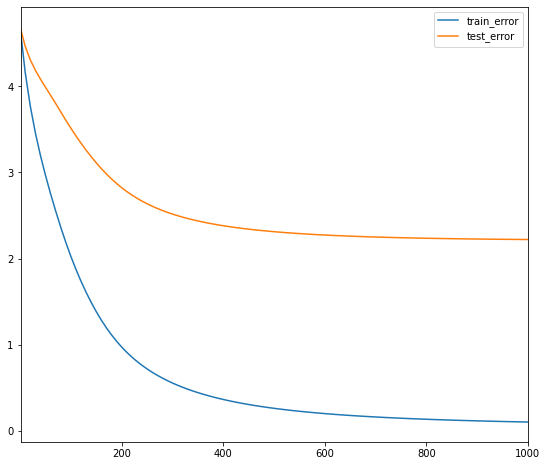

In [9]:
# Build the CF model and train it.
model = build_model(listens, embedding_dim=30, init_stddev=0.5)
model.train(num_iterations=1000, learning_rate=10.)

## III. Inspecting the Embeddings

In this section, we take a closer look at the learned embeddings, by
- computing recommendations
- looking at the nearest neighbors of some artists,
- looking at the norms of the artist embeddings,
- visualizing the embedding in a projected embedding space.

### Function to compute the scores of the candidates

We start by writing a function that, given a query embedding $u \in \mathbb R^d$ and item embeddings $V \in \mathbb R^{N \times d}$, computes the item scores.

There are different similarity measures we can use, and these can yield different results. We will compare the following:
- dot product: the score of item j is $\langle u, V_j \rangle$.
- cosine: the score of item j is $\frac{\langle u, V_j \rangle}{\|u\|\|V_j\|}$.

In [10]:
DOT = 'dot'
COSINE = 'cosine'
def compute_scores(query_embedding, item_embeddings, measure=DOT):
    """Computes the scores of the candidates given a query.
      Args:
        query_embedding: a vector of shape [k], representing the query embedding.
        item_embeddings: a matrix of shape [N, k], such that row i is the embedding
          of item i.
        measure: a string specifying the similarity measure to be used. Can be
          either DOT or COSINE.
      Returns:
        scores: a vector of shape [N], such that scores[i] is the score of item i.
        """
    u = query_embedding
    V = item_embeddings
    if measure == COSINE:
        V = V / np.linalg.norm(V, axis=1, keepdims=True)
        u = u / np.linalg.norm(u)
    scores = u.dot(V.T)
    return scores

Equipped with this function, we can compute recommendations, where the query embedding can be either a user embedding or an artist embedding.

### Artist Nearest neighbors

In [11]:
def artist_neighbors(model, artist_substring, measure=DOT, k=6):
    # Search for artist ids that match the given substring.
    ids =  artists[artists['name'].str.contains(artist_substring)].index.values
    names = artists.iloc[ids]['name'].values
    if len(names) == 0:
        raise ValueError("Found no artists with name %s" % artist_substring)
    print("Nearest neighbors of : %s." % names[0])
    if len(names) > 1:
        print("[Found more than one matching artist. Other candidates: {}]".format(
            ", ".join(names[1:])))
    artist_id = ids[0]
    scores = compute_scores(
        model.embeddings["artistID"][artist_id], model.embeddings["artistID"],
        measure)
    score_key = measure + ' score'
    df = pd.DataFrame({
        score_key: list(scores),
        'names': artists['name'],
    })
    display.display(df.sort_values([score_key], ascending=False).head(k))


In [12]:
artist_neighbors(model, 'Lady Gaga', DOT)
artist_neighbors(model, 'Lady Gaga', COSINE)

Nearest neighbors of : Lady Gaga.
[Found more than one matching artist. Other candidates: Lady Gaga VS Christina Aguilera, BeyoncÃ© e Lady Gaga, Lady Gaga feat BeyoncÃ©]


,dot score,names
83,5.441,Lady Gaga
6230,5.113,Slade
167,4.566,Placebo
531,4.557,The Used
8346,4.411,The Royal Guardsmen
66,4.383,Depeche Mode


Nearest neighbors of : Lady Gaga.
[Found more than one matching artist. Other candidates: Lady Gaga VS Christina Aguilera, BeyoncÃ© e Lady Gaga, Lady Gaga feat BeyoncÃ©]


,cosine score,names
83,1.000,Lady Gaga
372,0.887,Evanescence
151,0.881,Michael Jackson
343,0.878,The Pussycat Dolls
294,0.876,Katy Perry
695,0.865,Shakira


### Artist Embedding Norm

In [13]:
#  We can also observe that the recommendations with dot-product and cosine are different: with dot-product, the model tends to recommend popular artists. This can be explained by the fact that in matrix factorization models, the norm of the embedding is often correlated with popularity (popular artists have a larger norm), which makes it more likely to recommend more popular items. We can confirm this hypothesis by sorting the artists by their embedding norm, as done in the next cell.

In [14]:
artists_df.head()

,id,name,tag_1,tag_2,tag_3,all_tags,peak_year,listen_count
0,0,MALICE MIZER,j-pop,electronic - trance - psytrance,post-hardcore,"['pretentious crap', 'the weakerthans', 'j-pop...",2008,3
1,1,Diary of Dreams,goff,hi-nrg,post-hardcore,"['hi-nrg', 'hit', 'goff', 'trip hop', 'post-ha...",2009,12
2,2,Carpathian Forest,death metal,pissed off,show some love,"['death metal', 'show some love', 'pissed off'...",2008,3
3,3,Moi dix Mois,j-pop,c,electronic - trance - psytrance,"['j-pop', 'electronic - trance - psytrance', '...",2008,2
4,4,Bella Morte,goff,post-hardcore,instrumental,"['post-hardcore', 'instrumental', 'goff', 'gro...",2007,2


In [15]:
def artist_embedding_norm(models):
  """Visualizes the norm and number of ratings of the artist embeddings.
  Args:
    model: A MFModel object.
  """
  if not isinstance(models, list):
    models = [models]
  df = pd.DataFrame({
      'name': artists_df['name'],
      'tag': artists_df['tag_1'],
      'listen_count': artists_df['listen_count'],
  })
  charts = []
  brush = alt.selection_interval()
  for i, model in enumerate(models):
    norm_key = 'norm'+str(i)
    df[norm_key] = np.linalg.norm(model.embeddings["artistID"], axis=1)
    nearest = alt.selection(
        type='single', encodings=['x', 'y'], on='mouseover', nearest=True,
        empty='none')
    base = alt.Chart().mark_circle().encode(
        x='listen_count',
        y=norm_key,
        color=alt.condition(brush, alt.value('#4c78a8'), alt.value('lightgray'))
    ).properties(
        selection=nearest).add_selection(brush)
    text = alt.Chart().mark_text(align='center', dx=5, dy=-5).encode(
        x='listen_count', y=norm_key,
        text=alt.condition(nearest, 'name', alt.value('')))
    charts.append(alt.layer(base, text))
  return alt.hconcat(*charts, data=df)

def visualize_artist_embeddings(data, x, y):
  nearest = alt.selection(
      type='single', encodings=['x', 'y'], on='mouseover', nearest=True,
      empty='none')
  base = alt.Chart().mark_circle().encode(
      x=x,
      y=y,
#       color=alt.condition(genre_filter, "tag", alt.value("whitesmoke")),
  ).properties(
      width=600,
      height=600,
      selection=nearest)
  text = alt.Chart().mark_text(align='left', dx=5, dy=-5).encode(
      x=x,
      y=y,
      text=alt.condition(nearest, 'name', alt.value('')))
  return alt.hconcat(alt.layer(base, text), data=data)

def tsne_artist_embeddings(model):
  """Visualizes the artist embeddings, projected using t-SNE with Cosine measure.
  Args:
    model: A MFModel object.
  """
  tsne = sklearn.manifold.TSNE(
      n_components=2, perplexity=40, metric='cosine', early_exaggeration=10.0,
      init='pca', verbose=True, n_iter=400)

  print('Running t-SNE...')
  V_proj = tsne.fit_transform(model.embeddings["artistID"])
  artists_df.loc[:,'x'] = V_proj[:, 0]
  artists_df.loc[:,'y'] = V_proj[:, 1]
  return visualize_artist_embeddings(artists_df, 'x', 'y')

In [16]:
artist_embedding_norm(model)

alt.HConcatChart(...)

 iteration 1000: train_error=0.229635, test_error=0.601092

alt.HConcatChart(...)

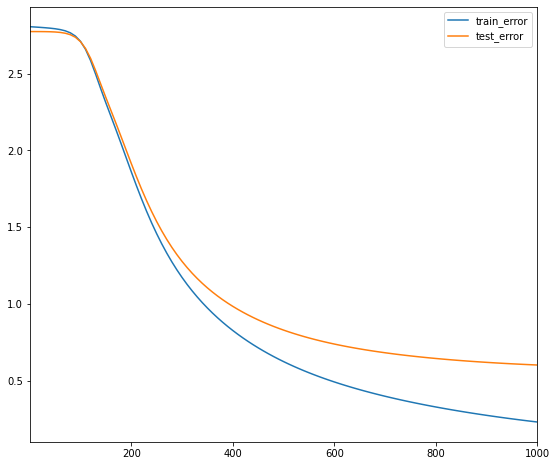

In [17]:
model_lowinit = build_model(listens, embedding_dim=30, init_stddev=0.05)
model_lowinit.train(num_iterations=1000, learning_rate=10.)
artist_embedding_norm([model, model_lowinit])

In [18]:
artist_neighbors(model_lowinit, "The Beatles", DOT)
artist_neighbors(model_lowinit, "The Beatles", COSINE)

Nearest neighbors of : The Beatles.
[Found more than one matching artist. Other candidates: The Beatles with Billy Preston]


,dot score,names
221,8.662,The Beatles
157,2.743,Pink Floyd
338,2.730,Taylor Swift
1240,2.373,Guns N' Roses
1039,2.341,The Kooks
418,2.195,The Strokes


Nearest neighbors of : The Beatles.
[Found more than one matching artist. Other candidates: The Beatles with Billy Preston]


,cosine score,names
221,1.000,The Beatles
12646,0.722,Dominici
9566,0.708,Cold World
2616,0.673,Paddy Milner
5090,0.672,Jon Gomm
8476,0.656,Wilderness


### Embedding visualization

Since it is hard to visualize embeddings in a higher-dimensional space (when the embedding dimension  k>3 ), one approach is to project the embeddings to a lower dimensional space. T-SNE (T-distributed Stochastic Neighbor Embedding) is an algorithm that projects the embeddings while attempting to preserve their pariwise distances. It can be useful for visualization, but one should use it with care. For more information on using t-SNE, see How to Use t-SNE Effectively.

In [19]:
tsne_artist_embeddings(model_lowinit)

Running t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 17632 samples in 0.000s...


C:\Users\User\anaconda3\envs\ml_recomsys\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\User\anaconda3\envs\ml_recomsys\lib\site-packages\sklearn\manifold\_t_sne.py:819: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  warnings.warn(


[t-SNE] Computed neighbors for 17632 samples in 11.493s...
[t-SNE] Computed conditional probabilities for sample 1000 / 17632
[t-SNE] Computed conditional probabilities for sample 2000 / 17632
[t-SNE] Computed conditional probabilities for sample 3000 / 17632
[t-SNE] Computed conditional probabilities for sample 4000 / 17632
[t-SNE] Computed conditional probabilities for sample 5000 / 17632
[t-SNE] Computed conditional probabilities for sample 6000 / 17632
[t-SNE] Computed conditional probabilities for sample 7000 / 17632
[t-SNE] Computed conditional probabilities for sample 8000 / 17632
[t-SNE] Computed conditional probabilities for sample 9000 / 17632
[t-SNE] Computed conditional probabilities for sample 10000 / 17632
[t-SNE] Computed conditional probabilities for sample 11000 / 17632
[t-SNE] Computed conditional probabilities for sample 12000 / 17632
[t-SNE] Computed conditional probabilities for sample 13000 / 17632
[t-SNE] Computed conditional probabilities for sample 14000 / 1763

C:\Users\User\anaconda3\envs\ml_recomsys\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 50 iterations with early exaggeration: 79.264992
[t-SNE] KL divergence after 400 iterations: 4.200246


alt.HConcatChart(...)

##  IV. Regularization In Matrix Factorization

In the previous section, our loss was defined as the mean squared error on the observed part of the rating matrix. This can be problematic as the model does not learn how to place the embeddings of irrelevant artists. This phenomenon is known as folding.

We will add regularization terms that will address this issue. We will use two types of regularization:

Regularization of the model parameters. This is a common  ℓ2  regularization term on the embedding matrices, given by  r(U,V)=1N∑i∥Ui∥2+1M∑j∥Vj∥2 .
A global prior that pushes the prediction of any pair towards zero, called the gravity term. This is given by  g(U,V)=1MN∑Ni=1∑Mj=1⟨Ui,Vj⟩2 .
The total loss is then given by
1|Ω|∑(i,j)∈Ω(Aij−⟨Ui,Vj⟩)2+λrr(U,V)+λgg(U,V) 
where  λr  and  λg  are two regularization coefficients (hyper-parameters).

### Build a regularized Matrix Factorization model and train it

In [20]:
def gravity(U, V):
  """Creates a gravity loss given two embedding matrices."""
  return 1. / (U.shape[0]*V.shape[0]) * tf.reduce_sum(
      tf.matmul(U, U, transpose_a=True) * tf.matmul(V, V, transpose_a=True))

def build_regularized_model(
    ratings, embedding_dim=3, regularization_coeff=.1, gravity_coeff=1.,
    init_stddev=0.1):
  """
  Args:
    listens: the DataFrame of artist listen counts.
    embedding_dim: The dimension of the embedding space.
    regularization_coeff: The regularization coefficient lambda.
    gravity_coeff: The gravity regularization coefficient lambda_g.
  Returns:
    A CFModel object that uses a regularized loss.
  """
  # Split the ratings DataFrame into train and test.
  train_ratings, test_ratings = split_dataframe(ratings)
  # SparseTensor representation of the train and test datasets.
  A_train = build_listens_sparse_tensor(train_ratings)
  A_test = build_listens_sparse_tensor(test_ratings)
  U = tf.Variable(tf.random_normal(
      [A_train.dense_shape[0], embedding_dim], stddev=init_stddev))
  V = tf.Variable(tf.random_normal(
      [A_train.dense_shape[1], embedding_dim], stddev=init_stddev))

  error_train = sparse_mean_square_error(A_train, U, V)
  error_test = sparse_mean_square_error(A_test, U, V)
  gravity_loss = gravity_coeff * gravity(U, V)
  regularization_loss = regularization_coeff * (
      tf.reduce_sum(U*U)/U.shape[0] + tf.reduce_sum(V*V)/V.shape[0])
  total_loss = error_train + regularization_loss + gravity_loss
  losses = {
      'train_error_observed': error_train,
      'test_error_observed': error_test,
  }
  loss_components = {
      'observed_loss': error_train,
      'regularization_loss': regularization_loss,
      'gravity_loss': gravity_loss,
  }
  embeddings = {"userID": U, "artistID": V}

  return CFModel(embeddings, total_loss, [losses, loss_components])

It is now time to train the regularized model! 

 iteration 2000: train_error_observed=0.122557, test_error_observed=0.883280, observed_loss=0.122557, regularization_loss=0.256443, gravity_loss=0.092118

[{'train_error_observed': 0.12255728, 'test_error_observed': 0.88328},
 {'observed_loss': 0.12255728,
  'regularization_loss': 0.25644276,
  'gravity_loss': 0.09211784}]

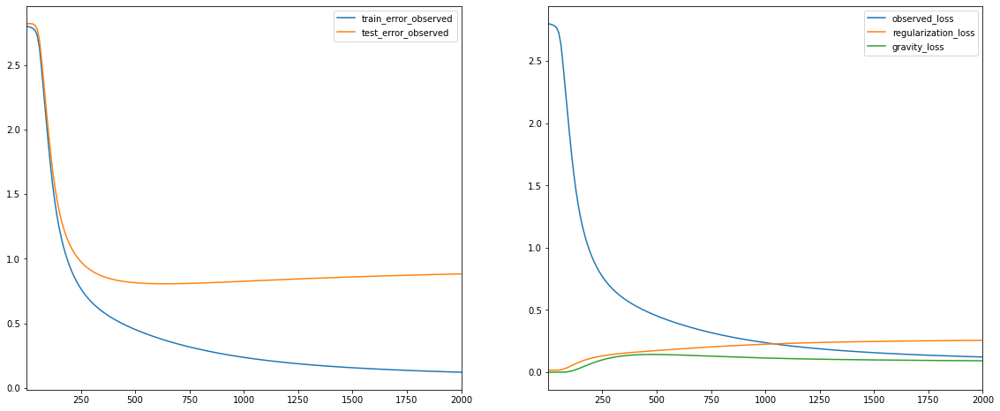

In [21]:
reg_model = build_regularized_model(
    listens, regularization_coeff=0.1, gravity_coeff=1.0, embedding_dim=35,
    init_stddev=.05)
reg_model.train(num_iterations=2000, learning_rate=20.)
# change iterations to 2000

In [22]:
jlk

NameError: name 'jlk' is not defined

In [ ]:
# Observe that adding the regularization terms results in a higher MSE, both on the training and test set. However, as we will see, the quality of the recommendations improves. This highlights a tension between fitting the observed data and minimizing the regularization terms. Fitting the observed data often emphasizes learning high similarity (between items with many interactions), but a good embedding representation also requires learning low similarity (between items with few or no interactions).

In the following cells, we display the nearest neighbors, the embedding norms, and the t-SNE projection of the artist embeddings.

In [ ]:
artist_neighbors(reg_model, "The Beatles", DOT)
artist_neighbors(reg_model, "The Beatles", COSINE)

Here we compare the embedding norms for `model` and `reg_model`. Selecting a subset of the embeddings will highlight them on both charts simultaneously.

In [ ]:
artist_embedding_norm([model, model_lowinit, reg_model])

In [ ]:
# Visualize the embeddings
tsne_artist_embeddings(reg_model)

In [ ]:
# We should observe that the embeddings have a lot more structure than the unregularized case. 

In [ ]:
### Conclusion
# This concludes this section on matrix factorization models. Note that while the scale of the problem is small enough to allow efficient training using SGD, many practical problems need to be trained using more specialized algorithms such as Alternating Least Squares (see [tf.contrib.factorization.WALSMatrixFactorization](https://www.tensorflow.org/api_docs/python/tf/contrib/factorization/WALSMatrixFactorization) for a TF implementation).

## V. Softmax model

In this section, we will train a simple softmax model that predicts whether a given user has listened to an artist.  
The model will take as input a feature vector $x$ representing the list of artist the user has listend to. We start from the listens DataFrame, which we group by userID.

In [ ]:
listened_artists = (listens[["userID", "artistID"]]
                .groupby("userID", as_index=False)
                .aggregate(lambda x: list(x.apply(str))))
listened_artists.userID = listened_artists.userID.astype('str')
listened_artists.head()

We then create a function that generates an example batch, such that each example contains the following features:
- artistID: A tensor of strings of the artist ids that the user listened to.
- tag: A tensor of strings of the tags of those artists
- year: A tensor of strings of the peak year.

In [ ]:
tags_dict = {
    artist: tags
    for artist, tags in zip(artists_df["id"], artists_df["all_tags"])
}

tags_dict['45']

In [ ]:
years_dict = {
    artist: year for artist, year in zip(artists_df["id"], artists_df["peak_year"])
}
tags_dict = {
    artist: tags
    for artist, tags in zip(artists_df["id"], artists_df["all_tags"])
}

def make_batch(listens, batch_size):
  """Creates a batch of examples.
  Args:
    listens: A DataFrame of ratings such that examples["artistID"] is a list of
      artists listened to by a user.
    batch_size: The batch size.
  """
  def pad(x, fill):
    return pd.DataFrame.from_dict(x).fillna(fill).values

  artist = []
  year = []
  tag = []
  label = []
  for artistIDs in listens["artistID"].values:
    # print(type(artistIDs[0]))
    artist.append(artistIDs)
    tag.append([x for artistID in artistIDs for x in tags_dict[artistID]])
    year.append([years_dict[artistID] for artistID in artistIDs])
    label.append([int(artistID) for artistID in artistIDs])
  features = {
      "id": pad(artist, ""),
      "peak_year": pad(year, ""),
      "tag_1": pad(tag, ""),
      "label": pad(label, -1)
  }
  batch = (
      tf.data.Dataset.from_tensor_slices(features)
      .shuffle(1000)
      .repeat()
      .batch(batch_size)
      .make_one_shot_iterator()
      .get_next())

  return batch

def select_random(x):
  """Selectes a random elements from each row of x."""
  def to_float(x):
    return tf.cast(x, tf.float32)
  def to_int(x):
    return tf.cast(x, tf.int64)
  batch_size = tf.shape(x)[0]
  rn = tf.range(batch_size)
  nnz = to_float(tf.count_nonzero(x >= 0, axis=1))
  rnd = tf.random_uniform([batch_size])
  ids = tf.stack([to_int(rn), to_int(nnz * rnd)], axis=1)
  return to_int(tf.gather_nd(x, ids))


### Loss function
Recall that the softmax model maps the input features $x$ to a user embedding $\psi(x) \in \mathbb R^d$, where $d$ is the embedding dimension. This vector is then multiplied by an artist embedding matrix $V \in \mathbb R^{m \times d}$ (where $m$ is the number of artists), and the final output of the model is the softmax of the product
$$
\hat p(x) = \text{softmax}(\psi(x) V^\top).
$$
Given a target label $y$, if we denote by $p = 1_y$ a one-hot encoding of this target label, then the loss is the cross-entropy between $\hat p(x)$ and $p$.

We will write a function that takes tensors representing the user embeddings  ψ(x) , movie embeddings  V , target label  y , and return the cross-entropy loss.

In [ ]:
def softmax_loss(user_embeddings, artist_embeddings, labels):
  """Returns the cross-entropy loss of the softmax model.
  Args:
    user_embeddings: A tensor of shape [batch_size, embedding_dim].
    artist_embeddings: A tensor of shape [num_artists, embedding_dim].
    labels: A tensor of [batch_size], such that labels[i] is the target label
      for example i.
  Returns:
    The mean cross-entropy loss.
  """
  # Verify that the embddings have compatible dimensions
  user_emb_dim = user_embeddings.shape[1]
  artist_emb_dim = artist_embeddings.shape[1]
  if user_emb_dim != artist_emb_dim:
    raise ValueError(
        "The user embedding dimension %d should match the artist embedding "
        "dimension % d" % (user_emb_dim, movie_emb_dim))

  logits = tf.matmul(user_embeddings, artist_embeddings, transpose_b=True)
  loss = tf.reduce_mean(tf.nn.sparse_softmax_cross_entropy_with_logits(
      logits=logits, labels=labels))
  return loss

### Build a softmax model, train it, and inspect its embeddings.

We are now ready to build a softmax CFModel. The architecture of the model is defined in the function `create_user_embeddings` and illustrated in the figure below. The input embeddings (artistID, tag_1 and peak_year) are concatenated to form the input layer, then we have hidden layers with dimensions specified by the `hidden_dims` argument. Finally, the last hidden layer is multiplied by the artist embeddings to obtain the logits layer. For the target label, we will use a randomly-sampled artistID from the list of artists the user has listened to.

![Softmax model](.\\softmax-model.png)

# redo image or delete it

In [ ]:

def build_softmax_model(listened_artists, embedding_cols, hidden_dims):
  """Builds a Softmax model for lastfm.
  Args:
    listened_artists: DataFrame of traing examples.
    embedding_cols: A dictionary mapping feature names (string) to embedding
      column objects. This will be used in tf.feature_column.input_layer() to
      create the input layer.
    hidden_dims: int list of the dimensions of the hidden layers.
  Returns:
    A CFModel object.
  """
  def create_network(features):
    """Maps input features dictionary to user embeddings.
    Args:
      features: A dictionary of input string tensors.
    Returns:
      outputs: A tensor of shape [batch_size, embedding_dim].
    """
    # Create a bag-of-words embedding for each sparse feature.
    inputs = tf.feature_column.input_layer(features, embedding_cols)
    # Hidden layers.
    input_dim = inputs.shape[1]
    for i, output_dim in enumerate(hidden_dims):
      w = tf.get_variable(
          "hidden%d_w_" % i, shape=[input_dim, output_dim],
          initializer=tf.truncated_normal_initializer(
              stddev=1./np.sqrt(output_dim))) / 10.
      outputs = tf.matmul(inputs, w)
      input_dim = output_dim
      inputs = outputs
    return outputs

  train_listened_artists, test_listened_artists = split_dataframe(listened_artists)
  train_batch = make_batch(train_listened_artists, 200)
  test_batch = make_batch(test_listened_artists, 100)

  with tf.variable_scope("model", reuse=False):
    # Train
    train_user_embeddings = create_network(train_batch)
    train_labels = select_random(train_batch["label"])
  with tf.variable_scope("model", reuse=True):
    # Test
    test_user_embeddings = create_network(test_batch)
    test_labels = select_random(test_batch["label"])
    artist_embeddings = tf.get_variable(
        "input_layer/id_embedding/embedding_weights")

  test_loss = softmax_loss(
      test_user_embeddings, artist_embeddings, test_labels)
  train_loss = softmax_loss(
      train_user_embeddings, artist_embeddings, train_labels)
  _, test_precision_at_10 = tf.metrics.precision_at_k(
      labels=test_labels,
      predictions=tf.matmul(test_user_embeddings, artist_embeddings, transpose_b=True),
      k=10)

  metrics = (
      {"train_loss": train_loss, "test_loss": test_loss},
      {"test_precision_at_10": test_precision_at_10}
  )
  embeddings = {"artistID": artist_embeddings}
  return CFModel(embeddings, train_loss, metrics)

### Train the Softmax model

We are now ready to train the softmax model. You can set the following hyperparameters:
- learning rate
- number of iterations. Note: you can run `softmax_model.train()` again to continue training the model from its current state.
- input embedding dimensions (the `input_dims` argument)
- number of hidden layers and size of each layer (the `hidden_dims` argument)

Note: since our input features are string-valued (artistID, tag_1, and peak_year), we need to map them to integer ids. This is done using [`tf.feature_column.categorical_column_with_vocabulary_list`](https://www.tensorflow.org/api_docs/python/tf/feature_column/categorical_column_with_vocabulary_list), which takes a vocabulary list specifying all the values the feature can take. Then each id is mapped to an embedding vector using [`tf.feature_column.embedding_column`](https://www.tensorflow.org/api_docs/python/tf/feature_column/embedding_column).


In [ ]:
# Create feature embedding columns
def make_embedding_col(key, embedding_dim):
  categorical_col = tf.feature_column.categorical_column_with_vocabulary_list(
      key=key, vocabulary_list=list(set(artists_df[key].values)), num_oov_buckets=0)
  return tf.feature_column.embedding_column(
      categorical_column=categorical_col, dimension=embedding_dim,
      # default initializer: trancated normal with stddev=1/sqrt(dimension)
      combiner='mean')

with tf.Graph().as_default():
  softmax_model = build_softmax_model(
      listened_artists,
      embedding_cols=[
          make_embedding_col("id", 35),
          make_embedding_col("tag_1", 3),
          make_embedding_col("peak_year", 2),
      ],
      hidden_dims=[35])

In [ ]:
softmax_model.train(
    learning_rate=8., num_iterations=3000, optimizer=tf.train.AdagradOptimizer)
# change iterations to 3000

In [ ]:
### Inspect the embeddings

# We can inspect the movie embeddings as we did for the previous models. Note that in this case, the movie embeddings are used at the same time as input embeddings (for the bag of words representation of the user history), and as softmax weights.

In [ ]:
artist_neighbors(softmax_model, "The Beatles", DOT)
artist_neighbors(softmax_model, "The Beatles", COSINE)

In [ ]:
artist_embedding_norm([reg_model, softmax_model])

In [ ]:
tsne_artist_embeddings(softmax_model)

## Conclusion

In [ ]:
# This concludes this section on matrix factorization models. Note that while the scale of the problem is small enough to allow efficient training using SGD, many practical problems need to be trained using more specialized algorithms such as Alternating Least Squares (see tf.contrib.factorization.WALSMatrixFactorization for a TF implementation).